In [1]:
import tensorflow as tf
import PIL
from PIL import Image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Dropout, Dense, Softmax)
from tensorflow.keras.applications import mobilenet as _mobilenet
import random
import os
import numpy as np
from subprocess import call
import scipy
import matplotlib.pyplot as plt
from matplotlib import cm
import math
from decimal import Decimal, localcontext

from pathlib import Path
from keras.applications import imagenet_utils

In [ ]:
# Video Classification 

In [2]:
%cd D:\ARC\UCL\Term 01\RC 11\Skills\Image Classification\video-classification-3d-cnn-pytorch

D:\ARC\UCL\Term 01\RC 11\Skills\Image Classification\video-classification-3d-cnn-pytorch


In [3]:
import json
import os
from moviepy.editor import *
from moviepy import *

In [7]:
def loadVideosToInfile(folder):
    videos = os.listdir(folder)
    with open('input', 'w') as inputfile:
        for v in videos:
            if v.split('.')[-1] == 'mp4':
                inputfile.write(v+'\n')

In [8]:
loadVideosToInfile('../Input_films')

In [9]:
! python main.py --input input --video_root ../Input_films --output ../output.json --model resnet-34-kinetics-cpu.pth --model_depth 34 --mode score --resnet_shortcut A --no_cuda

loading model resnet-34-kinetics-cpu.pth
../Input_films\BreakingBad.mp4
../Input_films\FamilyGuy.mp4
../Input_films\TheOffice.mp4
../Input_films\TheOffice02.mp4


ffmpeg version 2023-11-05-git-44a0148fad-full_build-www.gyan.dev Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 12.2.0 (Rev10, Built by MSYS2 project)
  configuration: --enable-gpl --enable-version3 --enable-static --pkg-config=pkgconf --disable-w32threads --disable-autodetect --enable-fontconfig --enable-iconv --enable-gnutls --enable-libxml2 --enable-gmp --enable-bzlib --enable-lzma --enable-libsnappy --enable-zlib --enable-librist --enable-libsrt --enable-libssh --enable-libzmq --enable-avisynth --enable-libbluray --enable-libcaca --enable-sdl2 --enable-libaribb24 --enable-libaribcaption --enable-libdav1d --enable-libdavs2 --enable-libuavs3d --enable-libzvbi --enable-librav1e --enable-libsvtav1 --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxavs2 --enable-libxvid --enable-libaom --enable-libjxl --enable-libopenjpeg --enable-libvpx --enable-mediafoundation --enable-libass --enable-frei0r --enable-libfreetype --enable-libfribidi --enable-libharfbuzz --e

In [10]:
! python generate_result_video/generate_result_video.py ../output.json ../input_films ../videos_pred class_names_list 5


ddddddddddddddddddddddddddddddddddddddddddddddd ../videos_pred
../input_films\BreakingBad.mp4
../input_films\FamilyGuy.mp4
../input_films\TheOffice.mp4
../input_films\TheOffice02.mp4


The directory is not empty.
A subdirectory or file tmp already exists.
ffmpeg version 2023-11-05-git-44a0148fad-full_build-www.gyan.dev Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 12.2.0 (Rev10, Built by MSYS2 project)
  configuration: --enable-gpl --enable-version3 --enable-static --pkg-config=pkgconf --disable-w32threads --disable-autodetect --enable-fontconfig --enable-iconv --enable-gnutls --enable-libxml2 --enable-gmp --enable-bzlib --enable-lzma --enable-libsnappy --enable-zlib --enable-librist --enable-libsrt --enable-libssh --enable-libzmq --enable-avisynth --enable-libbluray --enable-libcaca --enable-sdl2 --enable-libaribb24 --enable-libaribcaption --enable-libdav1d --enable-libdavs2 --enable-libuavs3d --enable-libzvbi --enable-librav1e --enable-libsvtav1 --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxavs2 --enable-libxvid --enable-libaom --enable-libjxl --enable-libopenjpeg --enable-libvpx --enable-mediafoundation --enable-libass --enable-f

In [11]:
file = open('../output.json')
segments = json.load(file)

In [12]:
print(len(segments))

4


In [13]:
segments[0].keys()

dict_keys(['video', 'clips'])

In [14]:
segments[0]['video']

'BreakingBad.mp4'

In [15]:
segments[0]['clips']

[{'segment': [1, 16],
  'label': 'singing',
  'scores': [0.35378557443618774,
   1.7044055461883545,
   4.272307395935059,
   4.28115701675415,
   -0.6286678910255432,
   3.0234715938568115,
   0.7709953784942627,
   -0.9203925728797913,
   -2.1392695903778076,
   4.845500946044922,
   -1.376420259475708,
   0.3174002170562744,
   1.2953565120697021,
   -0.9112460613250732,
   0.8046680092811584,
   -0.3063937723636627,
   2.8049063682556152,
   -1.199871301651001,
   0.36988282203674316,
   0.06621403992176056,
   -2.0136489868164062,
   0.006629049777984619,
   -2.372771739959717,
   -1.3559927940368652,
   -0.18264007568359375,
   -1.3753514289855957,
   -0.24050776660442352,
   0.0633993148803711,
   1.364820957183838,
   -2.4640913009643555,
   -1.8446054458618164,
   2.659168243408203,
   0.046481966972351074,
   -1.925580382347107,
   1.5911579132080078,
   -1.7484095096588135,
   0.38191133737564087,
   0.1398487389087677,
   -1.2016936540603638,
   -2.476600170135498,
   -1.51

In [16]:
segments[0]['clips'][0].keys()

dict_keys(['segment', 'label', 'scores'])

In [17]:
segments[0]['clips'][0]['segment']

[1, 16]

In [18]:
segments[0]['clips'][0]['label']

'singing'

In [19]:
segments[0]['clips'][0]['scores']

[0.35378557443618774,
 1.7044055461883545,
 4.272307395935059,
 4.28115701675415,
 -0.6286678910255432,
 3.0234715938568115,
 0.7709953784942627,
 -0.9203925728797913,
 -2.1392695903778076,
 4.845500946044922,
 -1.376420259475708,
 0.3174002170562744,
 1.2953565120697021,
 -0.9112460613250732,
 0.8046680092811584,
 -0.3063937723636627,
 2.8049063682556152,
 -1.199871301651001,
 0.36988282203674316,
 0.06621403992176056,
 -2.0136489868164062,
 0.006629049777984619,
 -2.372771739959717,
 -1.3559927940368652,
 -0.18264007568359375,
 -1.3753514289855957,
 -0.24050776660442352,
 0.0633993148803711,
 1.364820957183838,
 -2.4640913009643555,
 -1.8446054458618164,
 2.659168243408203,
 0.046481966972351074,
 -1.925580382347107,
 1.5911579132080078,
 -1.7484095096588135,
 0.38191133737564087,
 0.1398487389087677,
 -1.2016936540603638,
 -2.476600170135498,
 -1.5150315761566162,
 3.8590893745422363,
 -0.7001569271087646,
 1.751656174659729,
 0.6497189402580261,
 -1.306298017501831,
 -1.60195648670

In [20]:
len(segments[0]['clips'][0]['scores'])

400

In [21]:
classNames = []
with open('class_names_list', 'r') as class_names_list:
    index = 0
    for c in class_names_list:
        classNames.append({'index':index, 'name':c, 'score':0})
        index += 1


In [22]:
for i in range(len(segments[0]['clips'][0]['scores'])):
    score = segments[0]['clips'][0]['scores'][i]
    classNames[i]['score'] = score

In [23]:
classNames.sort(key = lambda x : x['score'], reverse = True)

In [24]:
classNames

[{'index': 304, 'name': 'singing\n', 'score': 7.809290885925293},
 {'index': 140,
  'name': 'giving or receiving award\n',
  'score': 6.030433177947998},
 {'index': 55, 'name': 'cheerleading\n', 'score': 5.798868179321289},
 {'index': 51, 'name': 'celebrating\n', 'score': 5.16722297668457},
 {'index': 9, 'name': 'auctioning\n', 'score': 4.845500946044922},
 {'index': 3, 'name': 'applauding\n', 'score': 4.28115701675415},
 {'index': 2, 'name': 'answering questions\n', 'score': 4.272307395935059},
 {'index': 247, 'name': 'playing trombone\n', 'score': 4.162742614746094},
 {'index': 303,
  'name': 'sign language interpreting\n',
  'score': 4.09454870223999},
 {'index': 243, 'name': 'playing recorder\n', 'score': 4.07932710647583},
 {'index': 41, 'name': 'busking\n', 'score': 3.8590893745422363},
 {'index': 377, 'name': 'waiting in line\n', 'score': 3.790515899658203},
 {'index': 219, 'name': 'playing bagpipes\n', 'score': 3.7024431228637695},
 {'index': 192, 'name': 'marching\n', 'score':

In [35]:
video = VideoFileClip(r"../Input_films/BreakingBad.mp4")
subVideo = video.subclip(10,15)
subVideo.write_videofile("../output_films/KillBill_10_15.mp4", audio_codec='aac')

Moviepy - Building video ../output_films/KillBill_10_15.mp4.
MoviePy - Writing audio in KillBill_10_15TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/KillBill_10_15.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/KillBill_10_15.mp4


In [36]:
subVideo.ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [37]:
video.fps

29.97002997002997

In [38]:
frame_length = 1/video.fps

In [39]:
frame_length

0.03336666666666667

In [40]:
label_periods = []
for f in segments:
    print(f['video'])
    currentLabel = None
    ts = 0
    te = 0
    for c in f['clips']:
        label = c['label']
        s = c['segment'][0]
        e = c['segment'][1]
        if label == currentLabel:
            te = e 
        else:
            label_periods.append([(ts,te),currentLabel, f['video']])

            ts = s
            te = e 
            currentLabel = label

BreakingBad.mp4
FamilyGuy.mp4
TheOffice.mp4
TheOffice02.mp4


In [29]:
label_periods

[[(0, 0), None, 'BreakingBad.mp4'],
 [(1, 96), 'singing', 'BreakingBad.mp4'],
 [(97, 112), 'dining', 'BreakingBad.mp4'],
 [(113, 144), 'playing poker', 'BreakingBad.mp4'],
 [(145, 160), 'dying hair', 'BreakingBad.mp4'],
 [(161, 208), 'giving or receiving award', 'BreakingBad.mp4'],
 [(209, 224), 'shaving head', 'BreakingBad.mp4'],
 [(225, 240), 'playing ukulele', 'BreakingBad.mp4'],
 [(241, 256), 'tai chi', 'BreakingBad.mp4'],
 [(257, 272), 'shaving head', 'BreakingBad.mp4'],
 [(273, 288), 'auctioning', 'BreakingBad.mp4'],
 [(289, 384), 'giving or receiving award', 'BreakingBad.mp4'],
 [(385, 400), 'playing ukulele', 'BreakingBad.mp4'],
 [(401, 432), 'applauding', 'BreakingBad.mp4'],
 [(433, 464), 'playing poker', 'BreakingBad.mp4'],
 [(465, 480), 'applauding', 'BreakingBad.mp4'],
 [(481, 496), 'playing poker', 'BreakingBad.mp4'],
 [(497, 512), 'testifying', 'BreakingBad.mp4'],
 [(513, 528), 'giving or receiving award', 'BreakingBad.mp4'],
 [(529, 560), 'capoeira', 'BreakingBad.mp4'],


In [100]:
len(label_periods)

133

In [105]:
longPeriods = []
for lp in label_periods:
    if lp[0][1]-lp[0][0] > 3/frame_length:
        longPeriods.append(lp)

In [106]:
longPeriods

[[(1, 96), 'singing', 'BreakingBad.mp4'],
 [(289, 384), 'giving or receiving award', 'BreakingBad.mp4'],
 [(641, 736), 'dodgeball', 'BreakingBad.mp4'],
 [(129, 224), 'writing', 'TheOffice.mp4'],
 [(225, 320), 'playing poker', 'TheOffice02.mp4']]

In [107]:
clips = []
for l in longPeriods:
    video = VideoFileClip(r"../Input_films/"+l[2])
    subclip = video.subclip(l[0][0]*frame_length,l[0][1]*frame_length)
    clips.append([subclip,l[1]+'_'+str(int(l[0][0]*frame_length))])

In [108]:
clips

[[<moviepy.video.io.VideoFileClip.VideoFileClip at 0x163ffe6b490>,
  'singing_0'],
  'giving or receiving award_9'],
  'dodgeball_21'],
  'writing_4'],
  'playing poker_7']]

In [109]:
clips[0][0].ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [110]:
folderPath = '../output_films/'
for c in clips:
    c[0].write_videofile(folderPath + c[1] + '.mp4', audio_codec='aac')


Moviepy - Building video ../output_films/singing_0.mp4.
MoviePy - Writing audio in singing_0TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/singing_0.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/singing_0.mp4
Moviepy - Building video ../output_films/giving or receiving award_9.mp4.
MoviePy - Writing audio in giving or receiving award_9TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/giving or receiving award_9.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/giving or receiving award_9.mp4
Moviepy - Building video ../output_films/dodgeball_21.mp4.
MoviePy - Writing audio in dodgeball_21TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/dodgeball_21.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/dodgeball_21.mp4
Moviepy - Building video ../output_films/writing_4.mp4.
MoviePy - Writing audio in writing_4TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/writing_4.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/writing_4.mp4
Moviepy - Building video ../output_films/playing poker_7.mp4.
MoviePy - Writing audio in playing poker_7TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/playing poker_7.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/playing poker_7.mp4


In [111]:
videos = os.listdir('../Input_films')

with open('input', 'w') as inputfile:
    for v in videos:
        if v.split('.')[-1] == 'mp4':
            inputfile.write(v+'\n')

In [125]:
!python main.py --input input --video_root ../input_films --output ../output02/outputKB_features.json --model resnet-34-kinetics-cpu.pth --mode feature --no_cuda


loading model resnet-34-kinetics-cpu.pth
../input_films\BreakingBad.mp4
../input_films\FamilyGuy.mp4
../input_films\TheOffice.mp4
../input_films\TheOffice02.mp4


ffmpeg version 2023-11-05-git-44a0148fad-full_build-www.gyan.dev Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 12.2.0 (Rev10, Built by MSYS2 project)
  configuration: --enable-gpl --enable-version3 --enable-static --pkg-config=pkgconf --disable-w32threads --disable-autodetect --enable-fontconfig --enable-iconv --enable-gnutls --enable-libxml2 --enable-gmp --enable-bzlib --enable-lzma --enable-libsnappy --enable-zlib --enable-librist --enable-libsrt --enable-libssh --enable-libzmq --enable-avisynth --enable-libbluray --enable-libcaca --enable-sdl2 --enable-libaribb24 --enable-libaribcaption --enable-libdav1d --enable-libdavs2 --enable-libuavs3d --enable-libzvbi --enable-librav1e --enable-libsvtav1 --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxavs2 --enable-libxvid --enable-libaom --enable-libjxl --enable-libopenjpeg --enable-libvpx --enable-mediafoundation --enable-libass --enable-frei0r --enable-libfreetype --enable-libfribidi --enable-libharfbuzz --e

In [5]:
file = open('../output02/outputKB_features.json')
segments = json.load(file)

In [6]:
len(segments)

4

In [7]:
import numpy as np

In [8]:
for s in segments: print(s['video'])

BreakingBad.mp4
FamilyGuy.mp4
TheOffice.mp4
TheOffice02.mp4


In [9]:
print(segments[0]['clips'][0].keys())

dict_keys(['segment', 'features'])


In [10]:
mhFeatures = []
for s in segments[0]['clips']:
    mhFeatures.append(np.array(s['features']))  

In [11]:
print(len(mhFeatures))

55


In [12]:
print(len(mhFeatures[0]))

512


In [13]:
kbFeatures = []
for s in segments[1]['clips']:
    kbFeatures.append(np.array(s['features']))  

In [14]:
print(len(kbFeatures))

60


In [15]:
bestRangeStart = 0
bestRangeScore = 100000000
for i in range(len(kbFeatures)-len(mhFeatures)):
    distance = 0
    for j in range(len(mhFeatures)):
        d = np.linalg.norm(kbFeatures[i+j]-mhFeatures[j])
        distance += d
    print(distance)
    if distance < bestRangeScore:
        bestRangeScore = distance
        bestRangeStart = i

1199.9890334598447
1197.5509705946254
1195.7054514994616
1196.9218389436646
1199.352843195841


In [16]:
bestRangeStart

2

In [17]:
kbVideo = VideoFileClip(r"../Input_films/FamilyGuy.mp4")
tsfps = kbVideo.fps
tsFrameLength = 1/tsfps

nrFrames = len(mhFeatures)*16
startFrame = bestRangeStart*16

startTime = startFrame*tsFrameLength
endTime = startTime+nrFrames*tsFrameLength

kbMatchedMhVideo = kbVideo.subclip(startTime,endTime)

In [18]:
kbMatchedMhVideo.ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


chunk:   0%|          | 0/647 [00:00<?, ?it/s, now=None]

MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [19]:
kbMatchedMhVideo.write_videofile("../output_films/KBWithMH.mp4", audio_codec='aac')

Moviepy - Building video ../output_films/KBWithMH.mp4.
MoviePy - Writing audio in KBWithMHTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/KBWithMH.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/KBWithMH.mp4


In [20]:
kbMatchedMhVideo.duration

29.333333333333332

In [21]:
frame = kbMatchedMhVideo.get_frame(0.5)

In [22]:
from PIL import Image

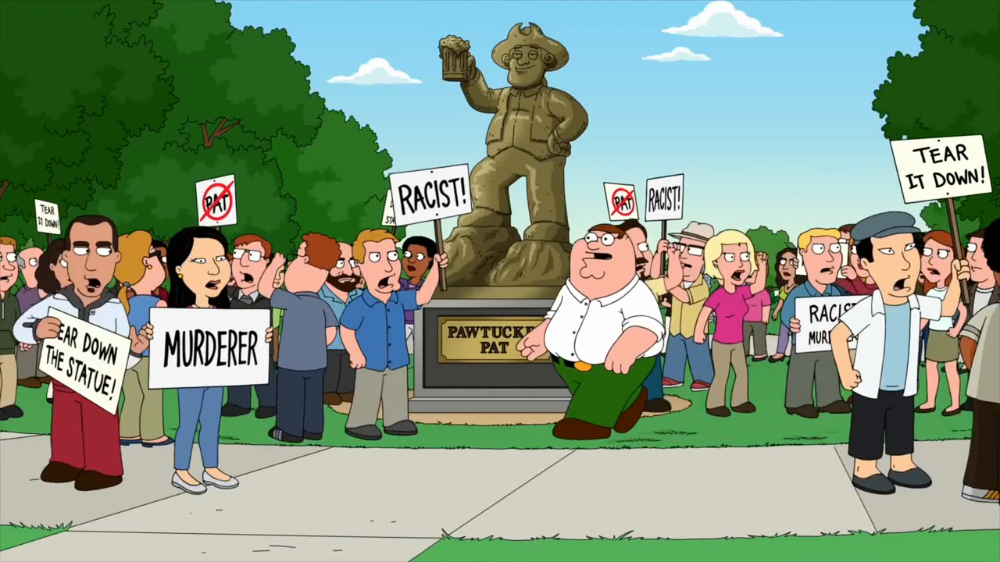

In [23]:
Image.fromarray(frame,'RGB')